## Hilbert-curve spatial data structure performance on 300 million point census dataset

This notebook contains some experiments with applying the Hilbert-curve based spatial data structure prototype to the census dataset.  First we'll create an out-of-core Dask DataFrame represening the dataset.

In [7]:
import datashader as ds
import datashader.transfer_functions as tf
import dask.dataframe as dd
import hilbert_frame as hf

In [8]:
# Load original dataframe out-of-core
df = dd.io.parquet.read_parquet('../../../notebook/datashader_dev/datashader-examples/data/census.snappy.parq')

In [9]:
df

,easting,northing,race
npartitions=4,,,
,float32,float32,category[unknown]
,...,...,...
,...,...,...
,...,...,...
,...,...,...


Next, import/preprocess this dataframe into a `HilbertFrame2D` object backed by the `census.hframe` directory.  This import step is relatively expensive,
taking a bit over 5 minutes in this case on a 2015 Macbook pro with 16GM of RAM.  This preprocessing step only needs to be done once, and future sessions can create a
`HilbertFrame2D` obejct from the `census.hframe` directory.

In [10]:
# %%time
# Took 5min 27s to preprocess ~300 million points on 2015 MBP with 16 RAM
# p = 6
# hframe = hf.HilbertFrame2D.from_dataframe(df=df,
#                                           dirname='census.hframe',
#                                           x='easting',
#                                           y='northing',
#                                           p=p,
#                                           shuffle='disk',
#                                           npartitions=32)

In [11]:
# Load preprocessed Hilbert frame
hframe = hf.HilbertFrame2D(dirname='census.hframe')

### Predefined zoom regions
Now define several interesting rectangular regions throughout the country 

In [12]:
USA           = ((-124.72,  -66.95), (23.55, 50.06))
LakeMichigan  = (( -91.68,  -83.97), (40.75, 44.08))
Chicago       = (( -88.29,  -87.30), (41.57, 42.00))
Chinatown     = (( -87.67,  -87.63), (41.84, 41.86))
NewYorkCity   = (( -74.39,  -73.44), (40.51, 40.91))
LosAngeles    = ((-118.53, -117.81), (33.63, 33.96))
Houston       = (( -96.05,  -94.68), (29.45, 30.11))
Austin        = (( -97.91,  -97.52), (30.17, 30.37))
NewOrleans    = (( -90.37,  -89.89), (29.82, 30.05))
Atlanta       = (( -84.88,  -84.04), (33.45, 33.84))

regions = {
    'USA': USA,
    'Lake Michigan': LakeMichigan,
    'Chicago': Chicago,
    'Chinatown': Chinatown,
    'New York City': NewYorkCity,
    'Los Angeles': LosAngeles,
    'Houston': Houston,
    'Austin': Austin,
    'New Orleans': NewOrleans,
    'Atlanta': Atlanta
}

from datashader.utils import lnglat_to_meters as webm
x_range,y_range = [list(r) for r in webm(*USA)]

plot_width  = int(900)
plot_height = int(plot_width*7.0/12)

Utility functions

In [13]:
from functools import partial
from datashader.utils import export_image
from datashader.colors import colormap_select, Greys9
from IPython.core.display import HTML, display
from colorcet import fire

# export = partial(export_image, background = background, export_path="export")
cm = partial(colormap_select)

display(HTML("<style>.container { width:100% !important; }</style>"))

Helper function to aggregate and shade the dataset for region.  When `use_hilbert=True` the Hilbert curve logic is invoked to load as few partitions as possible for the given x/y range, otherwise all partitions are loaded as is the current behavior.

In [14]:
def create_image(x_range, y_range, use_hilbert=False, w=plot_width, h=plot_height):
    cvs = ds.Canvas(plot_width=w, plot_height=h, x_range=x_range, y_range=y_range)
    if use_hilbert:
        df1 = hframe.range_query(x_range, y_range)
    else:
        df1 = df
    agg = cvs.points(df1, 'easting', 'northing')
    img = tf.shade(agg, cmap = cm(fire,0.2), how='eq_hist')
    return img

Display all regions with `use_hilbert=True` to show that it returns at least the points that are needed

USA


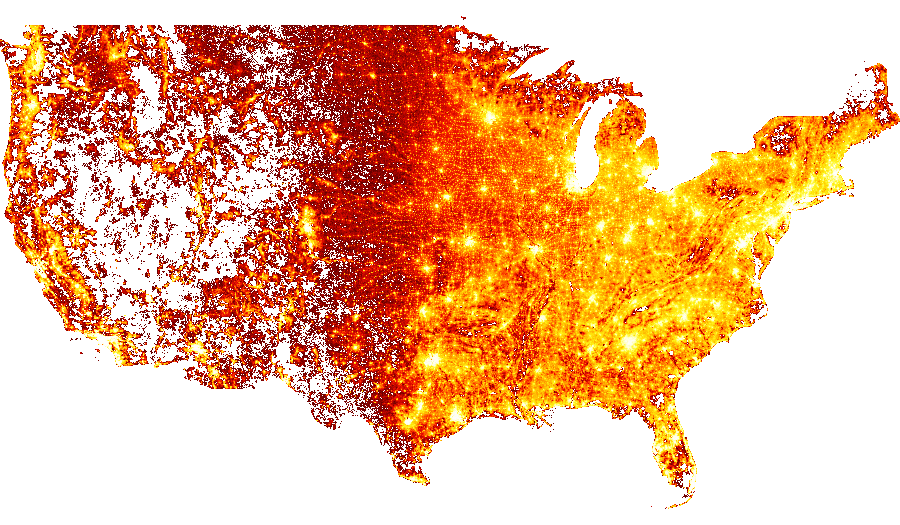

Lake Michigan


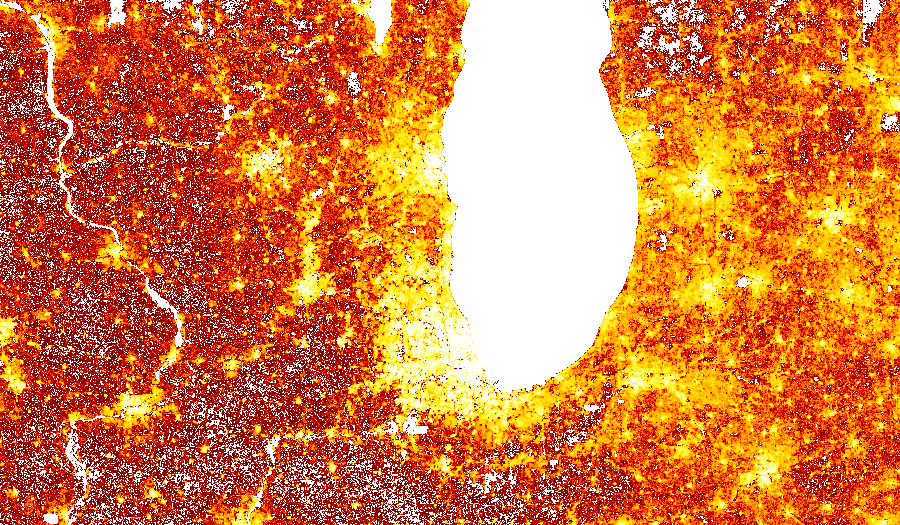

Chicago


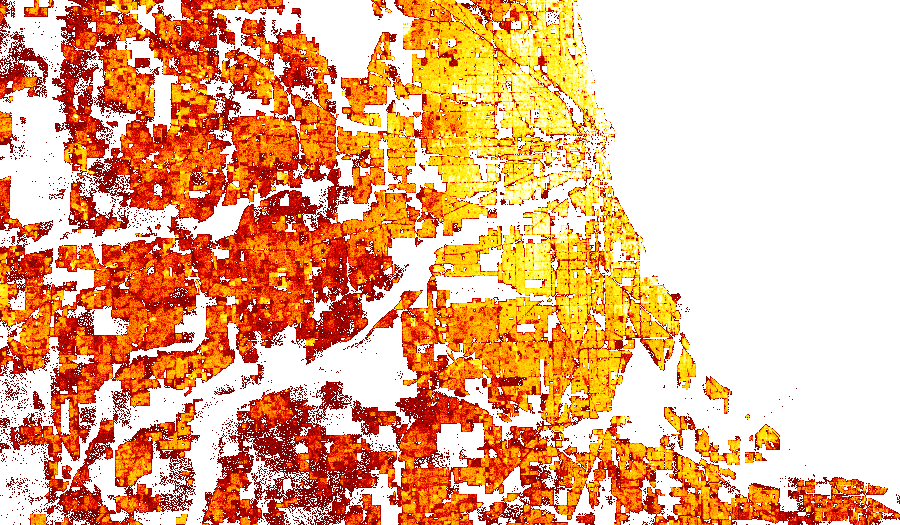

Chinatown


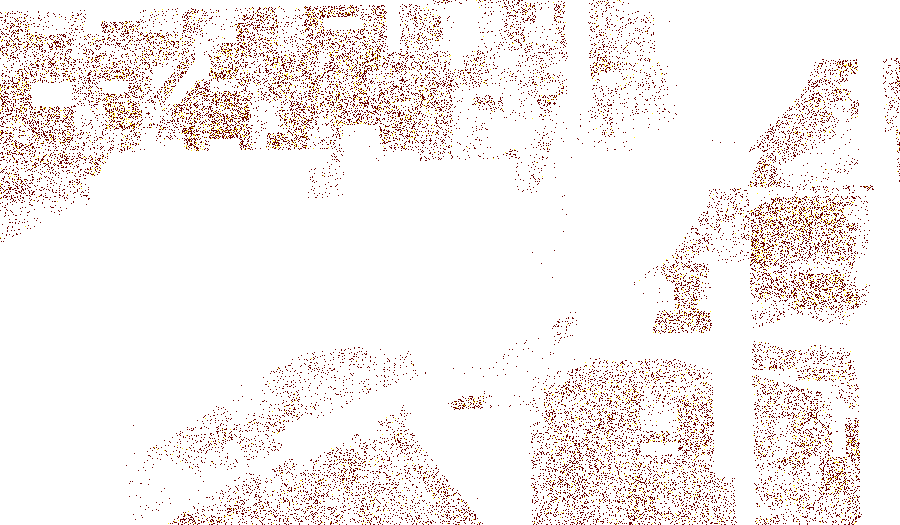

New York City


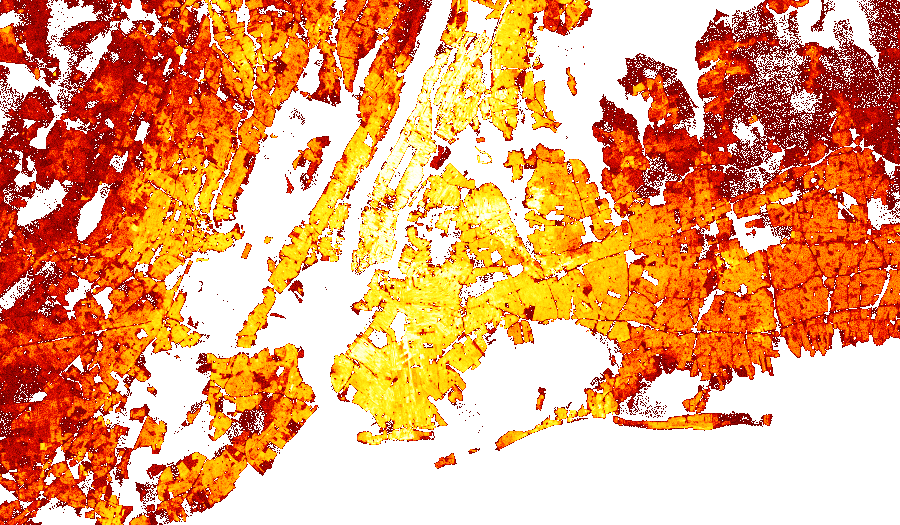

Los Angeles


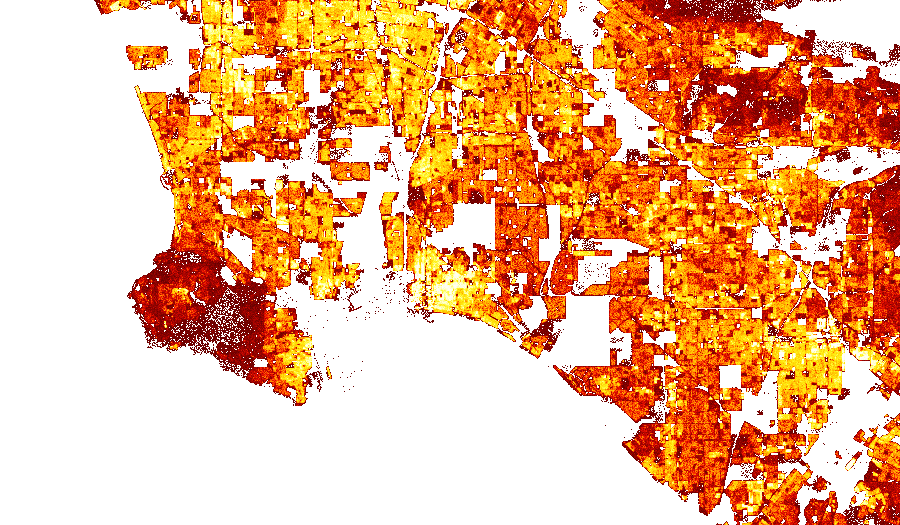

Houston


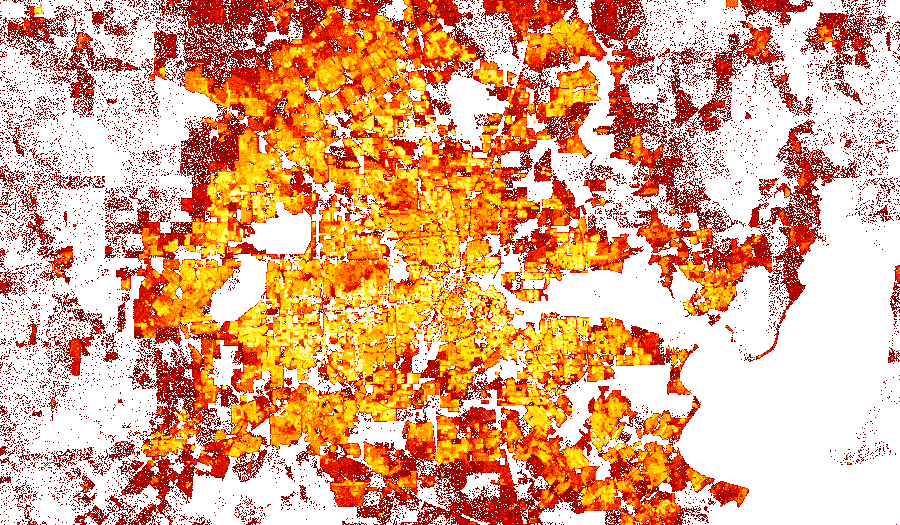

Austin


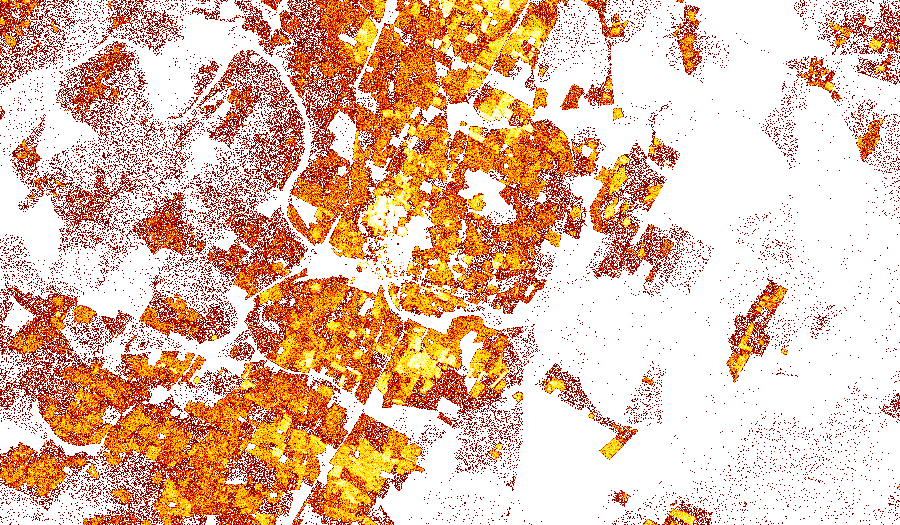

New Orleans


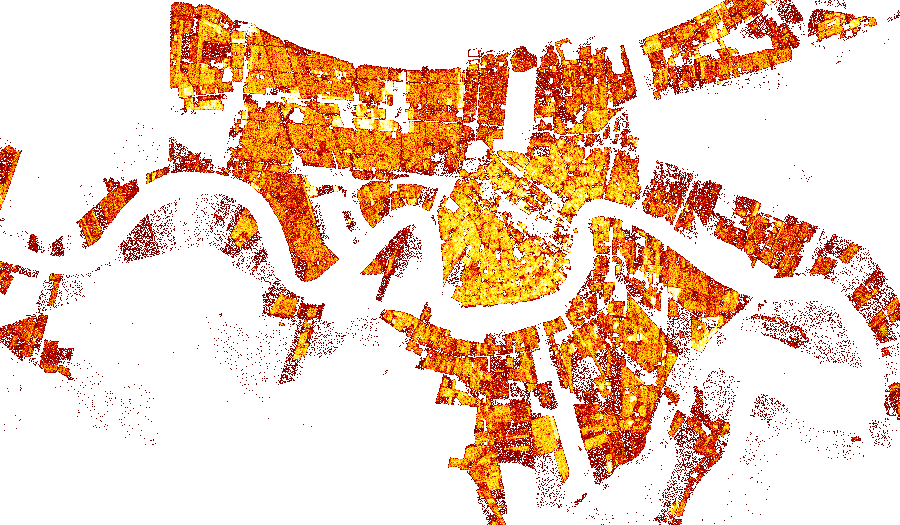

Atlanta


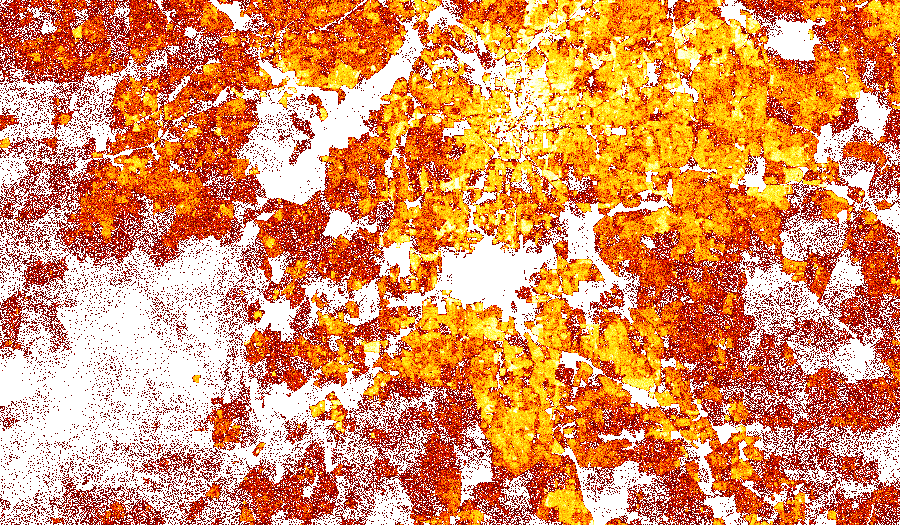

In [15]:
for region_name, regions_bounds in regions.items():
    print(region_name)
    display(create_image(*webm(*regions_bounds), use_hilbert=True, w=plot_width, h=plot_height))

Now, profile the render time for each view.  Note that these times are loading the dataset from the parquet files on disk each time.  Also, record the number of partitions that were required by the Hilbert curve method for each region.

In [80]:
default_region_timing = {}
hilbert_region_timing = {}
hilbert_region_partitions = {}

for region_name, regions_bounds in regions.items():
    # Time default
    default_region_timing[region_name] = %timeit -o create_image(*webm(*regions_bounds), use_hilbert=False, w=plot_width, h=plot_height)
    
    # Time Hilbert curve approach
    hilbert_region_timing[region_name] = %timeit -o create_image(*webm(*regions_bounds), use_hilbert=True, w=plot_width, h=plot_height)
    
    # Check how many partitions eaach view required with Hilbert approach
    df1 = hframe.range_query(*webm(*regions_bounds))
    hilbert_region_partitions[region_name] = df1.npartitions

11.4 s ± 117 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
9.59 s ± 297 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
11.3 s ± 297 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
3.15 s ± 137 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
11.2 s ± 234 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
1.76 s ± 72.7 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
11 s ± 145 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
1.94 s ± 30.7 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
11 s ± 182 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
2.35 s ± 75.5 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
11.5 s ± 149 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
1.73 s ± 44.1 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
11.1 s ± 199 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
1.83 s ± 33.6 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
11.3 s ± 366 ms per loop (mean ± std. dev. of 7 runs, 1 loop 

Profile render time for `persist=True`.  Now repeat the same profiling with `persist=True`, forcing the dataset to be loaded into memory only once.

In [81]:
# Default with persist
df = df.persist()
def create_image_default_persist(x_range, y_range, use_hilbert=False, w=plot_width, h=plot_height):
    cvs = ds.Canvas(plot_width=w, plot_height=h, x_range=x_range, y_range=y_range)
    df1 = df
    agg = cvs.points(df1, 'easting', 'northing')
    img = tf.shade(agg, cmap = cm(fire,0.2), how='eq_hist')
    return img

In [82]:
default_region_timing_persist = {}
for region_name, regions_bounds in regions.items():
    # Time default
    default_region_timing_persist[region_name] = %timeit -o create_image_default_persist(*webm(*regions_bounds), use_hilbert=False, w=plot_width, h=plot_height)

587 ms ± 47.4 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
271 ms ± 9.46 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
182 ms ± 7.49 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)
136 ms ± 10.3 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)
219 ms ± 3.64 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
180 ms ± 8.55 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)
182 ms ± 8.19 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)
162 ms ± 14.3 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)
154 ms ± 13 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)
188 ms ± 11.1 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)


In [83]:
# Hilbert with persist
del df
hframe = hf.HilbertFrame2D(dirname='census.hframe', persist=True)
def create_image_hilbert_persist(x_range, y_range, use_hilbert=False, w=plot_width, h=plot_height):
    cvs = ds.Canvas(plot_width=w, plot_height=h, x_range=x_range, y_range=y_range)
    df1 = hframe.range_query(x_range, y_range)
    agg = cvs.points(df1, 'easting', 'northing')
    img = tf.shade(agg, cmap = cm(fire,0.2), how='eq_hist')
    return img

In [100]:
hframe_region_timing_persist = {}

for region_name, regions_bounds in regions.items():
    hframe_region_timing_persist[region_name] = %timeit -o create_image_hilbert_persist(*webm(*regions_bounds), use_hilbert=True, w=plot_width, h=plot_height)

635 ms ± 4.49 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
160 ms ± 512 µs per loop (mean ± std. dev. of 7 runs, 10 loops each)
94.3 ms ± 373 µs per loop (mean ± std. dev. of 7 runs, 10 loops each)
25.9 ms ± 64.7 µs per loop (mean ± std. dev. of 7 runs, 10 loops each)
138 ms ± 524 µs per loop (mean ± std. dev. of 7 runs, 10 loops each)
90.6 ms ± 200 µs per loop (mean ± std. dev. of 7 runs, 10 loops each)
110 ms ± 3.33 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)
55.3 ms ± 147 µs per loop (mean ± std. dev. of 7 runs, 10 loops each)
48.7 ms ± 1.29 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)
86.2 ms ± 1.77 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)


## Visualize results

In [87]:
import pandas as pd
import plotly.graph_objs as go
import plotly.io as pio
from plotly.offline import init_notebook_mode, iplot
init_notebook_mode()
pio.templates.default = 'plotly'

In [104]:
def box_trace(timing_dict):
    df = pd.DataFrame({name: [t / tr.loops for t in tr.all_runs] for name, tr in timing_dict.items()})
    df = df.melt(var_name='region')
    return go.Box(x=df.region, y=df.value)

In [108]:
fig = go.Figure()
fig.add_trace(box_trace(default_region_timing).update(name='Default'));
fig.add_trace(box_trace(hilbert_region_timing).update(name='Hilbert'));

fig.layout.yaxis.range = [0, 14]
fig.layout.height = 700
fig.layout.title = 'Census timing for on-disk data'
fig.layout.yaxis.title = 'Render time (s)'

iplot(fig)

In [107]:
fig = go.Figure()
fig.add_trace(box_trace(default_region_timing_persist).update(name='Default'));
fig.add_trace(box_trace(hframe_region_timing_persist).update(name='Hilbert'));

fig.layout.yaxis.range = [0, 1]
fig.layout.height = 700
fig.layout.title = 'Census timing for persisted data'
fig.layout.yaxis.title = 'Render time (s)'
iplot(fig)

## Observations
For this dataset and these configuration parameters the Hilbert method significantly reduces render time when viewing a subset of the data as long as the dataset is being loaded from disk.  When the data is already persisted, the Hilbert method is somewhat faster in all cases except when the full dataset is being rendered, in which case it's ~10-15% slower.

## Open questions
 - I don't understand why the Hilbert method is slightly faster than the default when displaying the entire country, as all partitions must be loaded in each case.